In [1]:
import torchvision
import torch.nn as nn
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms,models,datasets
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from collections.abc import Iterable
import numpy as np
from glob import glob
from torch import optim
from tqdm import tqdm
DEVICE = 'cuda:0' if torch.cuda.is_available() else 'cpu'
import cv2, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
%matplotlib inline
from sklearn.exceptions import UndefinedMetricWarning
import warnings
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
import os
from efficientunet import *
from sklearn.preprocessing import OneHotEncoder
torch.cuda.empty_cache()
import os

DEVICE

'cuda:0'

### Metrics

In [2]:
class BinaryMetrics():
    def __init__(self, eps=1e-5, activation='0-1'):
        self.eps = eps
        self.activation = activation

    def _calculate_overlap_metrics(self, gt, pred):
        output = pred.view(-1, )
        target = gt.view(-1, ).float()

        tp = torch.sum(output * target)  # TP
        fp = torch.sum(output * (1 - target))  # FP
        fn = torch.sum((1 - output) * target)  # FN
        tn = torch.sum((1 - output) * (1 - target))  # TN

        pixel_acc = (tp + tn + self.eps) / (tp + tn + fp + fn + self.eps)
        dice = (2 * tp + self.eps) / (2 * tp + fp + fn + self.eps)
        precision = (tp + self.eps) / (tp + fp + self.eps)
        recall = (tp + self.eps) / (tp + fn + self.eps)
        specificity = (tn + self.eps) / (tn + fp + self.eps)

        return pixel_acc, dice, precision, specificity, recall

    def __call__(self, y_true, y_pred):
        y_true = y_true.to("cpu")
        y_pred = y_pred.to("cpu")
        if self.activation in [None, 'none']:
            activation_fn = lambda x: x
            activated_pred = activation_fn(y_pred)
        elif self.activation == "sigmoid":
            activation_fn = nn.Sigmoid()
            activated_pred = activation_fn(y_pred)
        elif self.activation == "0-1":
            sigmoid_pred = nn.Sigmoid()(y_pred)
            activated_pred = (sigmoid_pred > 0.5).float().to(y_pred.device)
        else:
            raise NotImplementedError("Not a supported activation!")

        assert activated_pred.shape[1] == 1, 'Predictions must contain only one channel' \
                                             ' when performing binary segmentation'
        pixel_acc, dice, precision, specificity, recall = self._calculate_overlap_metrics(y_true.to(y_pred.device,
                                                                                                    dtype=torch.float),
                                                                                          activated_pred)
        return [pixel_acc, dice, precision, specificity, recall]

In [3]:
def f1_macro(y_true, y_pred):
    return f1_score(y_true, y_pred, average='macro')

### Train + Val dataset class

In [4]:
class imagesXNN_train(Dataset):
    def __init__(self, path):
        self.images = glob(f"{path}/images/*")
        self.masks = glob(f"{path}/masks/*")

    def __len__(self): return len(self.images)

    def __getitem__(self, ix): 
        img_path = self.images[ix]
        im = cv2.imread(img_path)[:,:,::-1]
        mask_path = self.masks[ix]
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)/255
        r = np.stack((mask, mask), axis=2)
        res = np.stack(((r[:,:,1] == 1)*1, (r[:,:,0] == 0)*1), axis=2)
        return torch.tensor(im/255).permute(2,0,1).float(), torch.tensor(res).permute(2,0,1).float()

In [5]:
class oneclass_ds(Dataset):
    def __init__(self, path, augment=None):
        self.images = glob(f"{path}/imgs/*")
        self.masks = glob(f"{path}/masks/*")
        self.augment = augment

    def __len__(self): return len(self.images)

    def __getitem__(self, ix): 
        img_path = self.images[ix]
        im = cv2.imread(img_path)[:,:,::-1]
        mask_path = self.masks[ix]
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)/255
        
        if self.augment != None:
            sample = self.augment(image=im, mask=mask)
            im, mask = sample['image'], sample['mask']
        
        return torch.tensor(im/255).permute(2,0,1).float(), torch.tensor(mask[np.newaxis, :, :]).float()

In [6]:
class test_DS(Dataset):
    def __init__(self, path):
        self.images = glob(f"{path}/imgs/*");
        
    def __len__(self): return len(self.images)
    
    def __getitem__(self, ix):
        img_path = self.images[ix]
        im = cv2.imread(img_path)[:,:,::-1]
        
        return torch.tensor(im/255).permute(2,0,1).float()

In [7]:
import albumentations as albu

def get_training_augmentation():
    train_transform = [
#         albu.HorizontalFlip(p=0.5),
        albu.Rotate(p=0.5,limit=(-10,45),border_mode=0),
        #albu.RandomCrop(height=450,width=520,p=0.5),
        albu.IAAAdditiveGaussianNoise(p=0.3),
        albu.OneOf(
            [
                albu.CLAHE(p=0.5),
                albu.RandomBrightness(p=0.5),
                albu.RandomGamma(p=0.5),
            ],
            p=0.9,
        ),
        albu.OneOf(
            [
                albu.RandomContrast(p=1),
                albu.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
    ]
    return albu.Compose(train_transform)

### Training routine

In [8]:
def train_epoch(model, loader, criterion, optim, metrics):
    local_loss = 0
    hist = []
    
    model.train()
    for step, (images, labels) in tqdm(enumerate(loader), total=len(loader)):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        outputs = model(images)
        local_loss = criterion(outputs, labels)
        local_loss.backward()
        optim.step()
        optim.zero_grad()
        local_loss += local_loss.item()
        metr = metrics(labels, outputs)
        hist.append(metr)

    mean_metrics = np.array(hist).mean(axis=1)
    print(f"Train epoch Pixel Accuracy: {mean_metrics[0]}, Dice: {mean_metrics[1]}")
    return local_loss/(step + 1), mean_metrics

In [9]:
def valid_epoch(model, loader, criterion, metrics):
    local_loss = 0
    hist = []

    model.eval()
    for step, (images, labels) in tqdm(enumerate(loader), total=len(loader)):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        with torch.no_grad():
            outputs = model(images)
            local_loss = criterion(outputs, labels)
            local_loss += local_loss.item()
            metr = metrics(labels, outputs)
            hist.append(metr)

    mean_metrics = np.array(hist).mean(axis=1)
    print(f"Validation epoch Pixel Accuracy: {mean_metrics[0]}, Dice: {mean_metrics[1]}")
    return local_loss/(step + 1), mean_metrics

In [10]:
def train(model, num_epochs, train_dl, valid_dl, loss_fn, optimizer, tolerance = 0.02, metrics = None):
    loss_hist_train = [0] * num_epochs
    metrics_hist_train = []
    loss_hist_valid = [0] * num_epochs
    metrics_hist_valid = []

    for epoch in range(num_epochs):

        loss_tr_ep, metrics_train = train_epoch(model, train_dl, loss_fn, optimizer, metrics)
        loss_hist_train[epoch] = loss_tr_ep
        metrics_hist_train.append(metrics_train)
        
        loss_ep, metrics_valid = valid_epoch(model, valid_dl, loss_fn, metrics)
        loss_hist_valid[epoch] = loss_ep
        metrics_hist_valid.append(metrics_valid)

        if epoch == 40:
            optimizer.param_groups[0]['lr'] /= 10
        if epoch == 65:
            optimizer.param_groups[0]['lr'] /= 10
        if epoch == 85:
            optimizer.param_groups[0]['lr'] /= 10
        
        if epoch == 0:
            best_loss_val = loss_ep
            torch.save(model.state_dict(), f'effunet_b5_{epoch}.pt')
        else:
            if loss_ep < min(best_loss_val, tolerance):
                best_loss_val = loss_ep
                torch.save(model.state_dict(), f'effunet_b5_{epoch}.pt')

        print(f'Epoch {epoch+1} train loss: {loss_tr_ep:{1}.{5}} val loss: {loss_ep:{1}.{5}}')
    if os.path.exists(f'effunet_b5_{epoch}.pt'):
        model.load_state_dict(torch.load(f'effunet_b5_{epoch}.pt'))
    return loss_hist_train, loss_hist_valid, metrics_hist_train, metrics_hist_valid, best_loss_val

### Define dataloaders

In [11]:
validation_split = 0.1
seed = 10

trn_ds = oneclass_ds(r"C:\Users\fano\bts\data\train",augment=get_training_augmentation())

indxs = list(range(len(trn_ds)))
split = int(np.floor(validation_split*len(trn_ds)))
np.random.seed(seed)
np.random.shuffle(indxs)
trn_ind, val_ind = indxs[split:], indxs[:split]

trn_s = SubsetRandomSampler(trn_ind)
val_s = SubsetRandomSampler(val_ind)

trn_dl = DataLoader(trn_ds, batch_size=1, drop_last=True, num_workers=0, pin_memory=True, sampler=trn_s)
vld_dl = DataLoader(trn_ds, batch_size=4, drop_last=True, num_workers=0, sampler=val_s)

C:\Users\fano\anaconda3\lib\site-packages\albumentations\imgaug\transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
C:\Users\fano\anaconda3\lib\site-packages\albumentations\augmentations\transforms.py:1149: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
C:\Users\fano\anaconda3\lib\site-packages\albumentations\augmentations\transforms.py:1175: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


### Train single classifier

In [13]:
model = get_efficientunet_b5(out_channels=1)

In [14]:
model.final_conv = nn.Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1))

In [15]:
model

EfficientUnet(
  (encoder): Encoder(
    (stem_conv): Conv2dSamePadding(3, 48, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (stem_batch_norm): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (stem_swish): Swish()
    (blocks): ModuleList(
      (0): MBConvBlock(
        (swish): Swish()
        (_depthwise_conv): Conv2dSamePadding(48, 48, kernel_size=(3, 3), stride=(1, 1), groups=48, bias=False)
        (_bn1): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dSamePadding(48, 12, kernel_size=(1, 1), stride=(1, 1))
        (_se_expand): Conv2dSamePadding(12, 48, kernel_size=(1, 1), stride=(1, 1))
        (_project_conv): Conv2dSamePadding(48, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (_bn2): BatchNorm2d(24, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      )
      (1-2): 2 x MBConvBlock(
        (swish

In [16]:
from torch.optim import lr_scheduler
loss_fn = nn.BCEWithLogitsLoss()
bsm = BinaryMetrics()
optimizer = torch.optim.Adam(model.parameters(), lr= 1e-5)
model = model.to(DEVICE)
hst = train(model, 100, trn_dl, vld_dl, loss_fn, optimizer, metrics=bsm)

100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.08it/s]


Train epoch Pixel Accuracy: 0.369484543800354, Dice: 0.3718380331993103


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.99it/s]


Validation epoch Pixel Accuracy: 0.5281461477279663, Dice: 0.516262948513031
Epoch 1 train loss: 0.0042352 val loss: 0.14914


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.13it/s]


Train epoch Pixel Accuracy: 0.5968401432037354, Dice: 0.6039397716522217


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.8828390836715698, Dice: 0.8805117607116699
Epoch 2 train loss: 0.0034806 val loss: 0.12402


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.12it/s]


Train epoch Pixel Accuracy: 0.8798571825027466, Dice: 0.8688775300979614


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9220181703567505, Dice: 0.8404083251953125
Epoch 3 train loss: 0.0030041 val loss: 0.11043


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.09it/s]


Train epoch Pixel Accuracy: 0.9132579565048218, Dice: 0.9108551740646362


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.10it/s]


Validation epoch Pixel Accuracy: 0.9303840398788452, Dice: 0.9282819628715515
Epoch 4 train loss: 0.0027732 val loss: 0.10569


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.09it/s]


Train epoch Pixel Accuracy: 0.9386709332466125, Dice: 0.9207132458686829


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.33it/s]


Validation epoch Pixel Accuracy: 0.9379111528396606, Dice: 0.9372681379318237
Epoch 5 train loss: 0.0026532 val loss: 0.095834


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9474083185195923, Dice: 0.9436492919921875


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.9422988891601562, Dice: 0.9431160688400269
Epoch 6 train loss: 0.0025787 val loss: 0.095172


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9468159675598145, Dice: 0.9534896612167358


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.21it/s]


Validation epoch Pixel Accuracy: 0.9426795840263367, Dice: 0.9433826208114624
Epoch 7 train loss: 0.0025051 val loss: 0.090257


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.945020854473114, Dice: 0.9374693632125854


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


Validation epoch Pixel Accuracy: 0.9406756162643433, Dice: 0.93925940990448
Epoch 8 train loss: 0.0024355 val loss: 0.089524


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:11<00:00,  3.01it/s]


Train epoch Pixel Accuracy: 0.9346364140510559, Dice: 0.9513142704963684


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.85it/s]


Validation epoch Pixel Accuracy: 0.9580693244934082, Dice: 0.9501432180404663
Epoch 9 train loss: 0.0023798 val loss: 0.085972


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:13<00:00,  2.93it/s]


Train epoch Pixel Accuracy: 0.9591477513313293, Dice: 0.9633603096008301


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.19it/s]


Validation epoch Pixel Accuracy: 0.952724814414978, Dice: 0.9262338876724243
Epoch 10 train loss: 0.0023354 val loss: 0.083296


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.05it/s]


Train epoch Pixel Accuracy: 0.9645214080810547, Dice: 0.9604021906852722


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


Validation epoch Pixel Accuracy: 0.9491291046142578, Dice: 0.9449116587638855
Epoch 11 train loss: 0.0022825 val loss: 0.082424


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.05it/s]


Train epoch Pixel Accuracy: 0.9626190066337585, Dice: 0.9494119882583618


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.08it/s]


Validation epoch Pixel Accuracy: 0.956749439239502, Dice: 0.9596728086471558
Epoch 12 train loss: 0.0022147 val loss: 0.078567


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:11<00:00,  3.04it/s]


Train epoch Pixel Accuracy: 0.9321114420890808, Dice: 0.9538348317146301


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


Validation epoch Pixel Accuracy: 0.954673171043396, Dice: 0.9520320892333984
Epoch 13 train loss: 0.0021615 val loss: 0.081023


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.08it/s]


Train epoch Pixel Accuracy: 0.9549912214279175, Dice: 0.9565544128417969


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.20it/s]


Validation epoch Pixel Accuracy: 0.9441646337509155, Dice: 0.9613934755325317
Epoch 14 train loss: 0.0021038 val loss: 0.075011


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.12it/s]


Train epoch Pixel Accuracy: 0.960681140422821, Dice: 0.9518343210220337


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9560931324958801, Dice: 0.9598783254623413
Epoch 15 train loss: 0.00205 val loss: 0.071976


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9614003896713257, Dice: 0.9636086225509644


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.20it/s]


Validation epoch Pixel Accuracy: 0.9580011367797852, Dice: 0.9624279737472534
Epoch 16 train loss: 0.0020015 val loss: 0.071679


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9666953086853027, Dice: 0.9621201753616333


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.16it/s]


Validation epoch Pixel Accuracy: 0.9596455693244934, Dice: 0.9592770338058472
Epoch 17 train loss: 0.0019499 val loss: 0.06942


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9649790525436401, Dice: 0.9711372256278992


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.28it/s]


Validation epoch Pixel Accuracy: 0.9646932482719421, Dice: 0.9564776420593262
Epoch 18 train loss: 0.0018985 val loss: 0.068083


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9613083004951477, Dice: 0.9626539349555969


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9640731811523438, Dice: 0.9620121121406555
Epoch 19 train loss: 0.0018435 val loss: 0.068119


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9593477249145508, Dice: 0.9669071435928345


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.21it/s]


Validation epoch Pixel Accuracy: 0.9655830264091492, Dice: 0.9592266082763672
Epoch 20 train loss: 0.0018131 val loss: 0.063189


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9720512628555298, Dice: 0.9675803184509277


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9624679684638977, Dice: 0.9588223695755005
Epoch 21 train loss: 0.0017521 val loss: 0.062399


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9604307413101196, Dice: 0.9676967859268188


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.9670937657356262, Dice: 0.9421086311340332
Epoch 22 train loss: 0.0017053 val loss: 0.063336


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9714106321334839, Dice: 0.9631055593490601


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.27it/s]


Validation epoch Pixel Accuracy: 0.9604929089546204, Dice: 0.9623132944107056
Epoch 23 train loss: 0.0016666 val loss: 0.06001


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9717336893081665, Dice: 0.9740473031997681


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9674088358879089, Dice: 0.9603961110115051
Epoch 24 train loss: 0.0016287 val loss: 0.057653


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9677920341491699, Dice: 0.9722409248352051


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.28it/s]


Validation epoch Pixel Accuracy: 0.9685310125350952, Dice: 0.9672017097473145
Epoch 25 train loss: 0.0015721 val loss: 0.055216


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9631000757217407, Dice: 0.9670456051826477


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.19it/s]


Validation epoch Pixel Accuracy: 0.9569789171218872, Dice: 0.9680981636047363
Epoch 26 train loss: 0.0015307 val loss: 0.054602


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.14it/s]


Train epoch Pixel Accuracy: 0.9668726921081543, Dice: 0.9661785364151001


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.959605872631073, Dice: 0.9635535478591919
Epoch 27 train loss: 0.0015022 val loss: 0.053262


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9764565229415894, Dice: 0.9743974804878235


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.23it/s]


Validation epoch Pixel Accuracy: 0.9672977328300476, Dice: 0.9548290371894836
Epoch 28 train loss: 0.0014617 val loss: 0.05145


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9684371948242188, Dice: 0.9664751291275024


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9719880819320679, Dice: 0.9654324650764465
Epoch 29 train loss: 0.0014197 val loss: 0.051471


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9665725827217102, Dice: 0.9768140912055969


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.27it/s]


Validation epoch Pixel Accuracy: 0.9651893377304077, Dice: 0.9637930989265442
Epoch 30 train loss: 0.0013782 val loss: 0.049238


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9653618931770325, Dice: 0.9726270437240601


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.18it/s]


Validation epoch Pixel Accuracy: 0.9652901887893677, Dice: 0.9672830700874329
Epoch 31 train loss: 0.0013491 val loss: 0.048905


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9708029627799988, Dice: 0.9768165349960327


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.27it/s]


Validation epoch Pixel Accuracy: 0.9708173871040344, Dice: 0.9689639210700989
Epoch 32 train loss: 0.0013155 val loss: 0.047514


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9700117111206055, Dice: 0.9725021123886108


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9644328355789185, Dice: 0.9665446281433105
Epoch 33 train loss: 0.0012764 val loss: 0.045522


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9703744053840637, Dice: 0.9706804156303406


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.14it/s]


Validation epoch Pixel Accuracy: 0.9697524309158325, Dice: 0.974821925163269
Epoch 34 train loss: 0.00124 val loss: 0.044484


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9756973385810852, Dice: 0.9755607843399048


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9684720039367676, Dice: 0.9671656489372253
Epoch 35 train loss: 0.0012009 val loss: 0.042332


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9727322459220886, Dice: 0.9705918431282043


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.20it/s]


Validation epoch Pixel Accuracy: 0.9571827054023743, Dice: 0.9741001129150391
Epoch 36 train loss: 0.0011689 val loss: 0.041669


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9658546447753906, Dice: 0.9784994125366211


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.9716604351997375, Dice: 0.9691715240478516
Epoch 37 train loss: 0.0011443 val loss: 0.040584


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.12it/s]


Train epoch Pixel Accuracy: 0.9769434928894043, Dice: 0.9691567420959473


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.17it/s]


Validation epoch Pixel Accuracy: 0.9698623418807983, Dice: 0.9671916961669922
Epoch 38 train loss: 0.0010991 val loss: 0.040111


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9691494703292847, Dice: 0.9740775227546692


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.26it/s]


Validation epoch Pixel Accuracy: 0.9610769152641296, Dice: 0.9654766321182251
Epoch 39 train loss: 0.0010755 val loss: 0.038584


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9776118397712708, Dice: 0.9676529169082642


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.17it/s]


Validation epoch Pixel Accuracy: 0.9652172923088074, Dice: 0.9712570309638977
Epoch 40 train loss: 0.0010557 val loss: 0.037651


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9764319658279419, Dice: 0.9729701280593872


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.964352011680603, Dice: 0.9665428996086121
Epoch 41 train loss: 0.0010164 val loss: 0.036289


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9782997369766235, Dice: 0.9783250689506531


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.15it/s]


Validation epoch Pixel Accuracy: 0.973415195941925, Dice: 0.9707172513008118
Epoch 42 train loss: 0.0010207 val loss: 0.03644


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9719999432563782, Dice: 0.9714133143424988


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.19it/s]


Validation epoch Pixel Accuracy: 0.9718568921089172, Dice: 0.9619272351264954
Epoch 43 train loss: 0.001013 val loss: 0.036792


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9740134477615356, Dice: 0.9762431383132935


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.24it/s]


Validation epoch Pixel Accuracy: 0.969861626625061, Dice: 0.9665859341621399
Epoch 44 train loss: 0.0010122 val loss: 0.036023


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.13it/s]


Train epoch Pixel Accuracy: 0.9714368581771851, Dice: 0.971668541431427


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.00it/s]


Validation epoch Pixel Accuracy: 0.9610750079154968, Dice: 0.9710947275161743
Epoch 45 train loss: 0.001009 val loss: 0.035507


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.07it/s]


Train epoch Pixel Accuracy: 0.9718610644340515, Dice: 0.9738329648971558


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.9706228971481323, Dice: 0.9666681289672852
Epoch 46 train loss: 0.0010042 val loss: 0.036032


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.11it/s]


Train epoch Pixel Accuracy: 0.9701358675956726, Dice: 0.9768121838569641


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.13it/s]


Validation epoch Pixel Accuracy: 0.9698427319526672, Dice: 0.9730567932128906
Epoch 47 train loss: 0.00099796 val loss: 0.035959


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.10it/s]


Train epoch Pixel Accuracy: 0.9776117205619812, Dice: 0.9748551249504089


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.20it/s]


Validation epoch Pixel Accuracy: 0.9734076261520386, Dice: 0.9695401191711426
Epoch 48 train loss: 0.0009994 val loss: 0.035564


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9722234606742859, Dice: 0.9740708470344543


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9682451486587524, Dice: 0.9646941423416138
Epoch 49 train loss: 0.0010015 val loss: 0.035646


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.10it/s]


Train epoch Pixel Accuracy: 0.9765393137931824, Dice: 0.9680894613265991


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.18it/s]


Validation epoch Pixel Accuracy: 0.9667901992797852, Dice: 0.9668347239494324
Epoch 50 train loss: 0.00099543 val loss: 0.035443


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.06it/s]


Train epoch Pixel Accuracy: 0.978798508644104, Dice: 0.9794341325759888


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


Validation epoch Pixel Accuracy: 0.9560239911079407, Dice: 0.9736846685409546
Epoch 51 train loss: 0.0009871 val loss: 0.035286


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.10it/s]


Train epoch Pixel Accuracy: 0.9774796366691589, Dice: 0.9732612371444702


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.08it/s]


Validation epoch Pixel Accuracy: 0.974223792552948, Dice: 0.9699403643608093
Epoch 52 train loss: 0.00098555 val loss: 0.035338


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.972082257270813, Dice: 0.9723243713378906


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.06it/s]


Validation epoch Pixel Accuracy: 0.9712009429931641, Dice: 0.9673210382461548
Epoch 53 train loss: 0.00097946 val loss: 0.034894


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.09it/s]


Train epoch Pixel Accuracy: 0.9759474992752075, Dice: 0.9778951406478882


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.86it/s]


Validation epoch Pixel Accuracy: 0.9680765271186829, Dice: 0.9685418009757996
Epoch 54 train loss: 0.00098162 val loss: 0.034636


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.13it/s]


Train epoch Pixel Accuracy: 0.9794334173202515, Dice: 0.9726828336715698


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.15it/s]


Validation epoch Pixel Accuracy: 0.9671074151992798, Dice: 0.9603269696235657
Epoch 55 train loss: 0.00097294 val loss: 0.035657


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9721111059188843, Dice: 0.9733931422233582


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.9703850746154785, Dice: 0.9741856455802917
Epoch 56 train loss: 0.00097623 val loss: 0.035095


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9683340787887573, Dice: 0.9727198481559753


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9686833620071411, Dice: 0.9734259843826294
Epoch 57 train loss: 0.00097208 val loss: 0.034917


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.07it/s]


Train epoch Pixel Accuracy: 0.9719535112380981, Dice: 0.9723192453384399


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.15it/s]


Validation epoch Pixel Accuracy: 0.9692878723144531, Dice: 0.9733095169067383
Epoch 58 train loss: 0.00096857 val loss: 0.035295


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.13it/s]


Train epoch Pixel Accuracy: 0.9728620648384094, Dice: 0.9751611948013306


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


Validation epoch Pixel Accuracy: 0.9709354639053345, Dice: 0.9590207934379578
Epoch 59 train loss: 0.00096235 val loss: 0.035005


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.13it/s]


Train epoch Pixel Accuracy: 0.978023886680603, Dice: 0.9801508188247681


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.24it/s]


Validation epoch Pixel Accuracy: 0.963441014289856, Dice: 0.9676647186279297
Epoch 60 train loss: 0.00095874 val loss: 0.034502


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9718250036239624, Dice: 0.9790449142456055


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.19it/s]


Validation epoch Pixel Accuracy: 0.9709398150444031, Dice: 0.9743788838386536
Epoch 61 train loss: 0.00096162 val loss: 0.034498


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.14it/s]


Train epoch Pixel Accuracy: 0.9797307252883911, Dice: 0.9800384640693665


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.16it/s]


Validation epoch Pixel Accuracy: 0.9705120921134949, Dice: 0.9620113372802734
Epoch 62 train loss: 0.00095522 val loss: 0.033964


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9729080200195312, Dice: 0.9783803224563599


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.28it/s]


Validation epoch Pixel Accuracy: 0.9692777395248413, Dice: 0.9697019457817078
Epoch 63 train loss: 0.0009495 val loss: 0.034582


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.11it/s]


Train epoch Pixel Accuracy: 0.9783142805099487, Dice: 0.9700050354003906


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.05it/s]


Validation epoch Pixel Accuracy: 0.968390166759491, Dice: 0.9656771421432495
Epoch 64 train loss: 0.00094919 val loss: 0.034038


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:11<00:00,  3.04it/s]


Train epoch Pixel Accuracy: 0.9787050485610962, Dice: 0.9778686761856079


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.13it/s]


Validation epoch Pixel Accuracy: 0.9675958752632141, Dice: 0.9738383293151855
Epoch 65 train loss: 0.00094923 val loss: 0.03395


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:12<00:00,  2.97it/s]


Train epoch Pixel Accuracy: 0.9769283533096313, Dice: 0.9784658551216125


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.08it/s]


Validation epoch Pixel Accuracy: 0.9650422930717468, Dice: 0.9612683057785034
Epoch 66 train loss: 0.00094788 val loss: 0.03366


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.10it/s]


Train epoch Pixel Accuracy: 0.9780767560005188, Dice: 0.9760094881057739


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.23it/s]


Validation epoch Pixel Accuracy: 0.9623910784721375, Dice: 0.9684979319572449
Epoch 67 train loss: 0.0009431 val loss: 0.033859


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:11<00:00,  3.01it/s]


Train epoch Pixel Accuracy: 0.9773910641670227, Dice: 0.9768648147583008


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.28it/s]


Validation epoch Pixel Accuracy: 0.9726109504699707, Dice: 0.9723783731460571
Epoch 68 train loss: 0.00093997 val loss: 0.034077


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.11it/s]


Train epoch Pixel Accuracy: 0.9735678434371948, Dice: 0.9764415621757507


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.18it/s]


Validation epoch Pixel Accuracy: 0.9726106524467468, Dice: 0.9679422378540039
Epoch 69 train loss: 0.00094214 val loss: 0.033984


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9711788296699524, Dice: 0.9792755246162415


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.12it/s]


Validation epoch Pixel Accuracy: 0.9757569432258606, Dice: 0.9727533459663391
Epoch 70 train loss: 0.00093746 val loss: 0.034314


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9780133962631226, Dice: 0.9748561978340149


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.25it/s]


Validation epoch Pixel Accuracy: 0.9649142026901245, Dice: 0.9636389017105103
Epoch 71 train loss: 0.00093929 val loss: 0.034521


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9775224924087524, Dice: 0.9728703498840332


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.27it/s]


Validation epoch Pixel Accuracy: 0.9721646308898926, Dice: 0.9707497358322144
Epoch 72 train loss: 0.00094318 val loss: 0.033682


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9762294888496399, Dice: 0.9799426198005676


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.24it/s]


Validation epoch Pixel Accuracy: 0.9680795669555664, Dice: 0.9688838720321655
Epoch 73 train loss: 0.00094146 val loss: 0.034042


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9740713834762573, Dice: 0.9705527424812317


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.35it/s]


Validation epoch Pixel Accuracy: 0.9671887159347534, Dice: 0.9684940576553345
Epoch 74 train loss: 0.00093716 val loss: 0.033824


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.12it/s]


Train epoch Pixel Accuracy: 0.9782401919364929, Dice: 0.9740771055221558


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.20it/s]


Validation epoch Pixel Accuracy: 0.9671751856803894, Dice: 0.9628388285636902
Epoch 75 train loss: 0.00093525 val loss: 0.034211


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9720743298530579, Dice: 0.9744798541069031


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.31it/s]


Validation epoch Pixel Accuracy: 0.9710715413093567, Dice: 0.9641433954238892
Epoch 76 train loss: 0.0009454 val loss: 0.03357


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.15it/s]


Train epoch Pixel Accuracy: 0.9799350500106812, Dice: 0.9699705839157104


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.18it/s]


Validation epoch Pixel Accuracy: 0.970619797706604, Dice: 0.972690224647522
Epoch 77 train loss: 0.00094386 val loss: 0.03365


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.16it/s]


Train epoch Pixel Accuracy: 0.9738481640815735, Dice: 0.9759892225265503


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.9660804867744446, Dice: 0.9728671908378601
Epoch 78 train loss: 0.00093787 val loss: 0.033785


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:09<00:00,  3.09it/s]


Train epoch Pixel Accuracy: 0.9713774919509888, Dice: 0.9776546359062195


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.12it/s]


Validation epoch Pixel Accuracy: 0.9697454571723938, Dice: 0.9720322489738464
Epoch 79 train loss: 0.00093286 val loss: 0.033853


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.18it/s]


Train epoch Pixel Accuracy: 0.9773537516593933, Dice: 0.9725050926208496


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9702908396720886, Dice: 0.9695873260498047
Epoch 80 train loss: 0.000945 val loss: 0.033806


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.19it/s]


Train epoch Pixel Accuracy: 0.9706640243530273, Dice: 0.9713741540908813


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.40it/s]


Validation epoch Pixel Accuracy: 0.9737440943717957, Dice: 0.9644691348075867
Epoch 81 train loss: 0.00094432 val loss: 0.033742


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.9713228344917297, Dice: 0.9782474637031555


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.31it/s]


Validation epoch Pixel Accuracy: 0.9665339589118958, Dice: 0.9705804586410522
Epoch 82 train loss: 0.000939 val loss: 0.033855


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.19it/s]


Train epoch Pixel Accuracy: 0.9763702154159546, Dice: 0.9732640385627747


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9697288274765015, Dice: 0.973567008972168
Epoch 83 train loss: 0.00093433 val loss: 0.033831


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.9707916975021362, Dice: 0.9737569093704224


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.9727274775505066, Dice: 0.9731186628341675
Epoch 84 train loss: 0.00093816 val loss: 0.033459


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.21it/s]


Train epoch Pixel Accuracy: 0.9743844866752625, Dice: 0.9771102070808411


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.31it/s]


Validation epoch Pixel Accuracy: 0.9675639867782593, Dice: 0.9586563110351562
Epoch 85 train loss: 0.00094007 val loss: 0.033464


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.19it/s]


Train epoch Pixel Accuracy: 0.9697386026382446, Dice: 0.9739571809768677


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.28it/s]


Validation epoch Pixel Accuracy: 0.9496191143989563, Dice: 0.9721449017524719
Epoch 86 train loss: 0.00094148 val loss: 0.033595


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.9768915176391602, Dice: 0.973377525806427


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.27it/s]


Validation epoch Pixel Accuracy: 0.9712005853652954, Dice: 0.9695082902908325
Epoch 87 train loss: 0.00094046 val loss: 0.033395


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.9776679277420044, Dice: 0.9739214777946472


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.30it/s]


Validation epoch Pixel Accuracy: 0.9503697156906128, Dice: 0.9683856964111328
Epoch 88 train loss: 0.00093351 val loss: 0.033308


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.21it/s]


Train epoch Pixel Accuracy: 0.9733929634094238, Dice: 0.9696143269538879


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.34it/s]


Validation epoch Pixel Accuracy: 0.9670718908309937, Dice: 0.9735103845596313
Epoch 89 train loss: 0.00093548 val loss: 0.033363


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.19it/s]


Train epoch Pixel Accuracy: 0.9723143577575684, Dice: 0.9744745492935181


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.34it/s]


Validation epoch Pixel Accuracy: 0.9644634127616882, Dice: 0.9565242528915405
Epoch 90 train loss: 0.00093583 val loss: 0.033525


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.18it/s]


Train epoch Pixel Accuracy: 0.9778950810432434, Dice: 0.9776541590690613


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.09it/s]


Validation epoch Pixel Accuracy: 0.9651753306388855, Dice: 0.9589225649833679
Epoch 91 train loss: 0.00094157 val loss: 0.033949


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:10<00:00,  3.06it/s]


Train epoch Pixel Accuracy: 0.9722911715507507, Dice: 0.9705910682678223


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.26it/s]


Validation epoch Pixel Accuracy: 0.9715383648872375, Dice: 0.9708062410354614
Epoch 92 train loss: 0.00093766 val loss: 0.033781


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9780576825141907, Dice: 0.9705764651298523


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.33it/s]


Validation epoch Pixel Accuracy: 0.9675366282463074, Dice: 0.9619466066360474
Epoch 93 train loss: 0.00094281 val loss: 0.033462


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.21it/s]


Train epoch Pixel Accuracy: 0.9783517718315125, Dice: 0.9741188287734985


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.29it/s]


Validation epoch Pixel Accuracy: 0.9692853689193726, Dice: 0.9727047085762024
Epoch 94 train loss: 0.00093963 val loss: 0.033697


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.9790218472480774, Dice: 0.9794511795043945


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.31it/s]


Validation epoch Pixel Accuracy: 0.9708207249641418, Dice: 0.9711849093437195
Epoch 95 train loss: 0.00093305 val loss: 0.034362


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.20it/s]


Train epoch Pixel Accuracy: 0.97832190990448, Dice: 0.9770321846008301


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.11it/s]


Validation epoch Pixel Accuracy: 0.9646642804145813, Dice: 0.9684576988220215
Epoch 96 train loss: 0.00093702 val loss: 0.033578


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.17it/s]


Train epoch Pixel Accuracy: 0.9781454205513, Dice: 0.9783679246902466


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.23it/s]


Validation epoch Pixel Accuracy: 0.9656030535697937, Dice: 0.9667650461196899
Epoch 97 train loss: 0.00094222 val loss: 0.03359


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.14it/s]


Train epoch Pixel Accuracy: 0.9705206751823425, Dice: 0.9704554677009583


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.33it/s]


Validation epoch Pixel Accuracy: 0.9614938497543335, Dice: 0.9760492444038391
Epoch 98 train loss: 0.00093469 val loss: 0.033512


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:07<00:00,  3.18it/s]


Train epoch Pixel Accuracy: 0.9787472486495972, Dice: 0.9739383459091187


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.22it/s]


Validation epoch Pixel Accuracy: 0.9659395217895508, Dice: 0.9710067510604858
Epoch 99 train loss: 0.00094257 val loss: 0.033575


100%|████████████████████████████████████████████████████████████████████████████████| 216/216 [01:08<00:00,  3.18it/s]


Train epoch Pixel Accuracy: 0.9789694547653198, Dice: 0.9728814363479614


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.26it/s]

Validation epoch Pixel Accuracy: 0.9745286107063293, Dice: 0.972154974937439
Epoch 100 train loss: 0.00093277 val loss: 0.034093


In [ ]:
# model = get_efficientunet_b5(out_channels=1)
# model.final_conv = nn.Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1))
# model = model.to(DEVICE)
# model.load_state_dict(torch.load(r"C:\Users\fano\effunet_b5_78.pt"))

In [17]:
test_ds = test_DS(r"C:\Users\fano\bts\data\test")
test_dl = DataLoader(test_ds, batch_size=1, drop_last=False, num_workers=0, shuffle=False, )

In [18]:
len(test_dl)

80

In [19]:
def visualize(**images):
    n = len(images)
    plt.figure(figsize=(16,5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [20]:
import cv2
local_loss = 0
hist = []
responses = []
count = 161

model.eval()
for step, images in tqdm(enumerate(test_dl), total=len(test_dl)):
    images = images.to(DEVICE)
    with torch.no_grad():
        outputs = model(images)
        x = torch.sigmoid(outputs[0][0])
        black_white = (x>0.5).float()
        black_white = black_white.detach().cpu().numpy().round()
        black_white = (black_white*255).astype(np.uint8)
        cv2.imwrite(f"bts/data/test/masks/Image0{count}.png",black_white)
    
        coords = list(np.where(black_white.flatten()>0)[0])
        short_coords = [str(coords[0])]
        j = 1
        length = 1
        while j != len(coords):
            if coords[j]-1 in coords:
                length += 1
            else:
                short_coords.append(str(length))
                short_coords.append(str(coords[j]))
                length = 1
            j += 1
        short_coords.append(str(length))

        responses.append([count] + [" ".join(short_coords)])
        count += 1
    
sample = pd.DataFrame(responses, columns=["ImageID", "Expected"])
sample.to_csv(r"C:\Users\fano\bts\EfNetUnet.csv", index=None) 

100%|██████████████████████████████████████████████████████████████████████████████████| 80/80 [00:29<00:00,  2.69it/s]


80


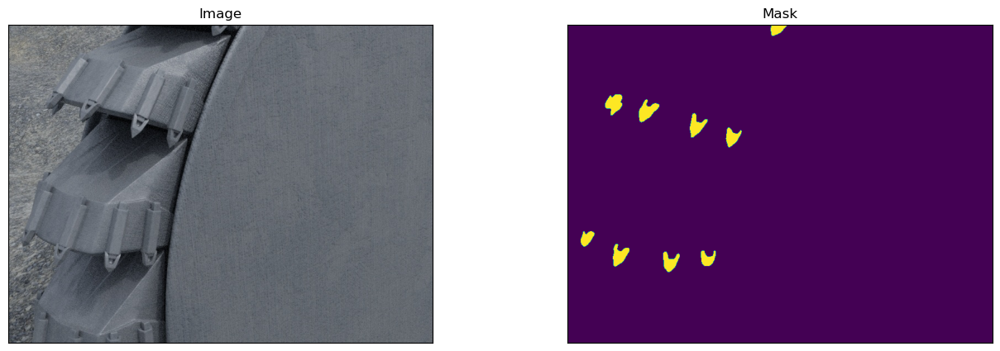

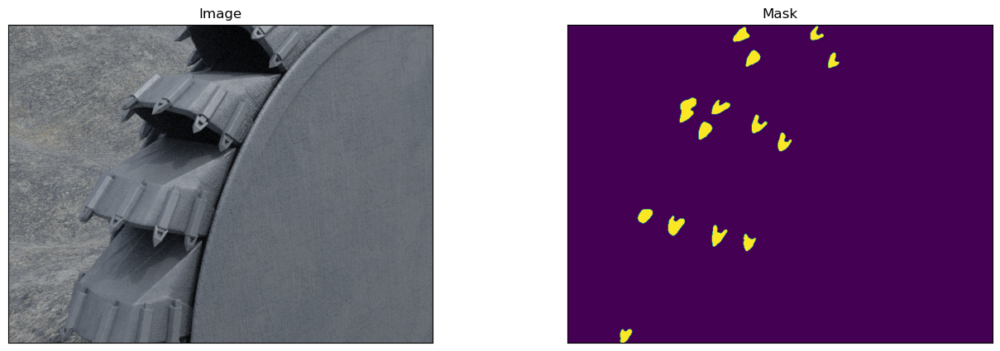

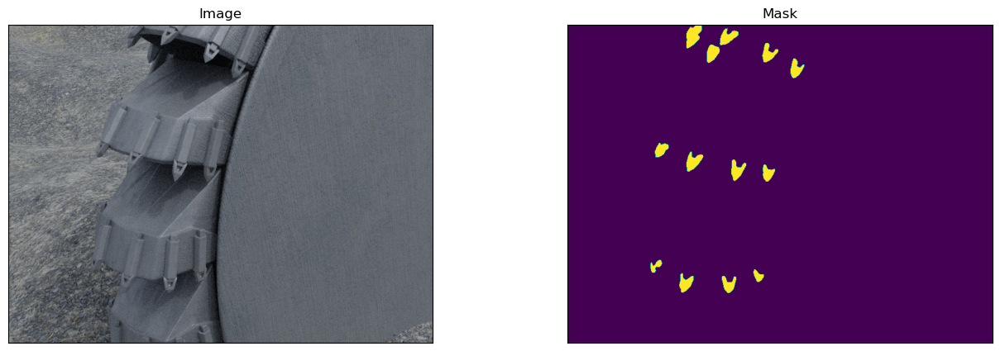

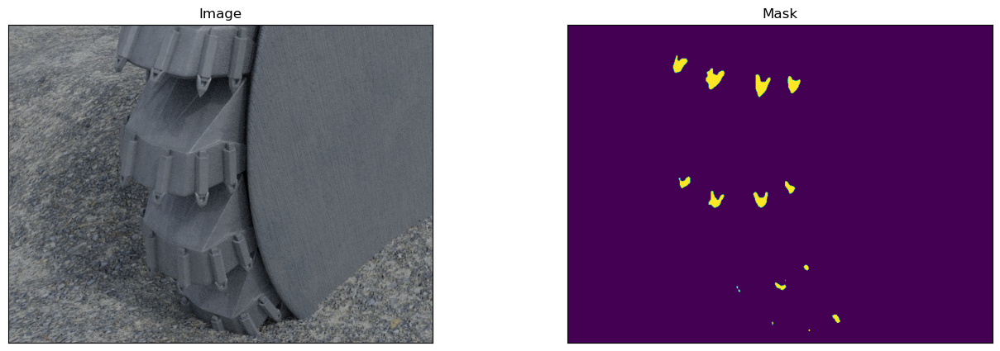

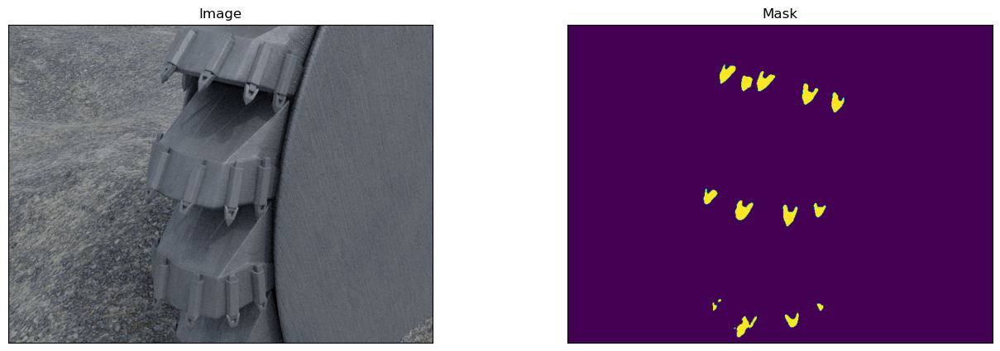

...

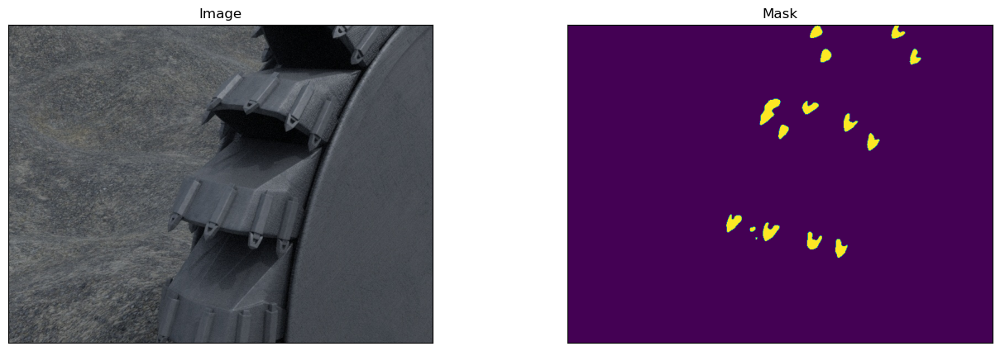

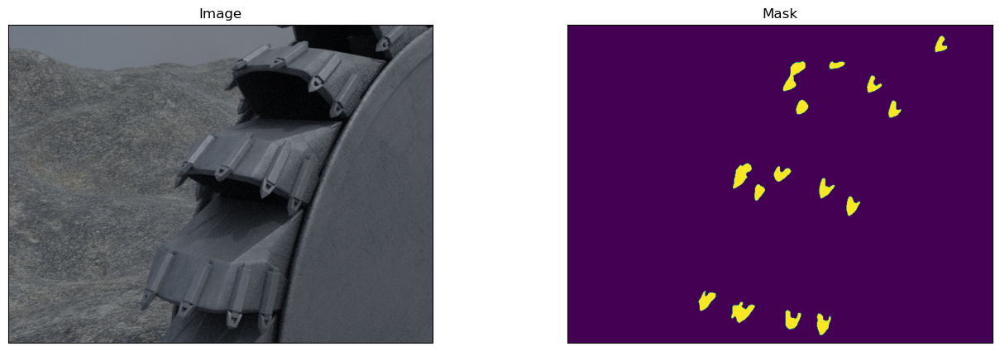

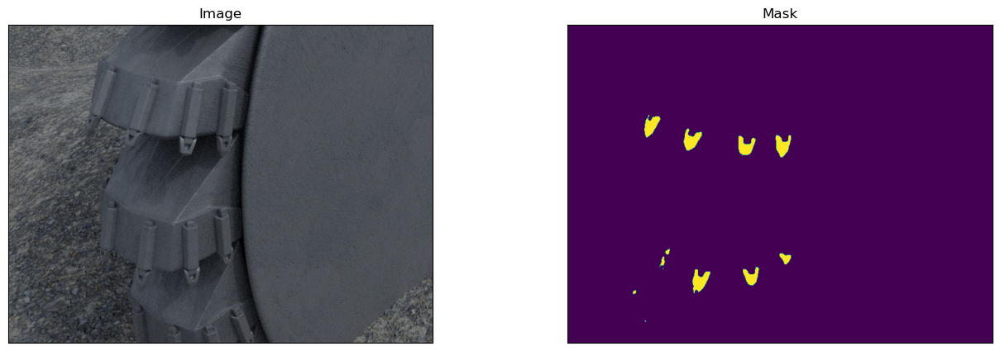

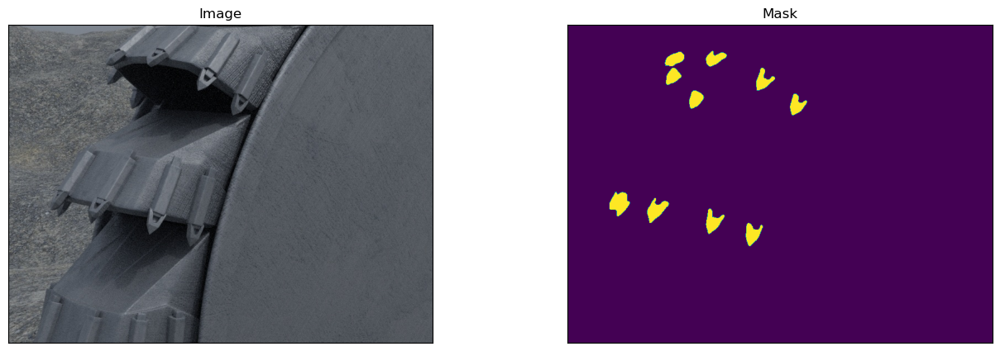

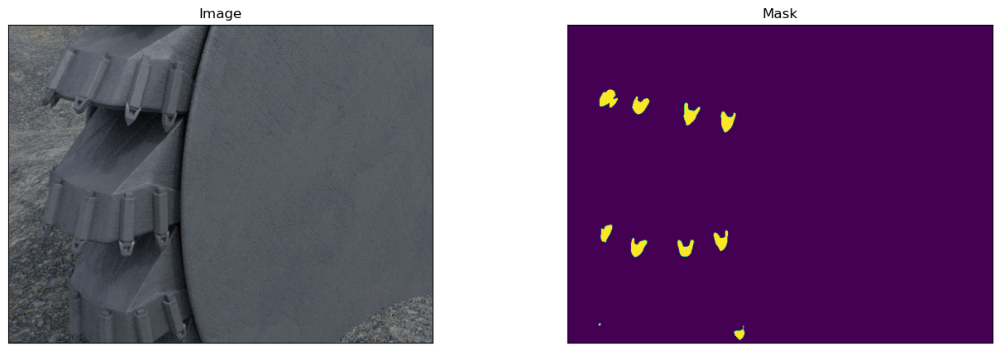

In [22]:
vis_ds = oneclass_ds(r"C:\Users\fano\bts\data\test")
print(len(vis_ds))

for i in range(30):
    image, mask = vis_ds[i]
    visualize(image=image.permute(1,2,0), mask=mask.squeeze())

In [ ]:
# todo наложение масок opevcv??